# 20210910 comments
As discussed, please add the statistical comparison (in a Table form and/or bar chart) of grooming 
count/time, summed grooming duration (or %) based on 6 confirmed datasets at 10 samples/day. 
Since they represent the current manual method of detecting/analyzing grooming. If the results 
reveal no clear difference, it would be easier to argue why we need to analyze the duration distribution 
for pain-related changes.

# 20210108 comments
Here are my thoughts on to-be-prepared Figures/Tables for the grooming papers (not only for biology paper, may also for engineering paper):
1. Fig 1 showing a single-day example of dataset 217 (like p3 of ppt), except the brown different-image time-series needs x2 their y-values to make the signal more visible. This is to show the day-night variations in movement known for rats.
2. Fig 2 (like p6,9,12) showing for 3 days (dataset 217) the duration time-series (for grooming/up, nongrooming/down) at 10 min bins (but in bar-graph) . 用10min duration, count放補充, 改bar, +做population (全部加起來, mean+sd)
3. Supplementary Fig matching Fig 2, showing similar pictures of population (mean,SD of 6 datasets)
4. Supplementary Fig matching Fig 2, on grooming/nongrooming ‘count’ instead of ‘duration’, showing similar pictures of population (mean,SD of 6 datasets).
5. Table 1 (like p4):

    a. insert a horizontal dashed-line between row 2 and row 3 (marking ‘computer analysis’ above dashed-line, and ‘manual judgment’ below).
    
    b. first row: replace block contents ‘Computer decision’ by ‘Initial screening image frames (xxx)’ .
    
    c. second row: replace block contents ‘Grooming (xxx)’ by ‘Grooming events (xxx, ???%); replace block contents ‘Non-grooming (xxx)’ by ‘Non-grooming events (xxx, ???%).
    
    d. third row: replace 4 blocks with ‘True positive events (xxx, ???%)’, ‘True negative events (xxx, ???%)’ … etc
    
6. Supplementary Table matching Table 1 showing population results from 3 days (showing contents in mean, SD of 6 datasets)

# 20201211 comments
1. Figure 1 (p9 of ppt), showing 2 animals (control, experimental) during the first day, the pattern of movement signal (brown), and the computer identified grooming (upward blue bars), and computer identified non-grooming (downward blue bars), the errors identified by human (red bars, up/down).
3. Figure 2 showing for experimental and control animals, their population time profiles at 20 or 30 min bins (of either a count, or duration but only on data confirmed by human) over the 3 days. This is to show little signs of clear changes between experimental and control animals. Therefore, the analysis of histogram is needed.


In [1]:
import pathlib
# from tqdm import tqdm
# from tqdm.notebook import trange, tqdm
from tqdm.autonotebook import tqdm
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from time import time
import platform
from skimage.util.shape import view_as_windows
from scipy import ndimage
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
mpl.rcParams.update({'figure.autolayout': True})

%matplotlib inline
plt.rcParams.update({'figure.max_open_warning': 0})
np.set_printoptions(precision=4, suppress=True)
pd.set_option('display.float_format', '{:,.4f}'.format)

_platform = platform.platform()
print('platform:', _platform, platform.node())
if 'linux' in _platform: # linux
    video_path = '/home/cclee/image_data/'
    out_path = '/home/cclee/tmp/rat/'
    train_path = '/home/cclee/tmp/rat/new_grooming/'
elif 'Darwin' in _platform: # MAC OS X
    rat_path = '/Users/cclee/rat_data/new_grooming/'
elif 'Windows' in _platform: # Windows
    if platform.node()=='Mozart':
        rat_path = 'e:/rat_data/new_grooming_rev1'
        out_path = 'e:/rat_data/'
    else:
        rat_path = 'd:/rat_data/new_grooming_rev1'
        out_path = 'd:/rat_data/'   
    
dpath = pathlib.Path(rat_path)
tsnpath = pathlib.Path('../tsn_my/')

<ipython-input-1-a0e4d6005af0>:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


platform: Windows-10-10.0.19041-SP0 Zephyrus


# 畫系統判讀結果

In [2]:
def assign_pred(df_pred, df, rat_days, lr):
    mask = (df_pred['rat']==int(rat_days)) & (df_pred['LR']==lr) 
    dfpp = df_pred[mask]
    df['target'] = 0
    df['pred'] = 0
    df['diff'] = 0
    for row in dfpp.itertuples():
        start = row.start
        end = start + row.duration-1
        if row.pred ==1:
            df.loc[start:end, 'pred'] = 1
        else:
            df.loc[start:end, 'pred'] = -1

        if row.target ==1:
            df.loc[start:end, 'target'] = 1
        else:
            df.loc[start:end, 'target'] = -1
           
        df.loc[start:end, 'diff'] = row.diff
        
    return df

In [3]:
def read_label(fname, df_pred, rat_days, lr):
    df = pd.read_csv(fname,  usecols=['nonzero_p5', 'label']) #, 'time'])
    df = assign_pred(df_pred, df, rat_days, lr)
    df = df.reset_index()
    df = df.rename(columns={"index":'time'})
    df['time'] = pd.to_datetime(df['time'], unit='s')
    df = df.reset_index().set_index('time')
    df = df.rename(columns={"index":'frame'})
#     print('----'*10, 'df')
#     display(df)
#     print(df.dtypes)

    ss_nonzero = df['nonzero_p5'].resample('30s').max()
    df1 = df.resample('5s').mean()
    df1['label'] = df1['label'].astype('int')
    df1['max_nonzero'] = ss_nonzero
    df1 = df1.reset_index()
    
    df1 = df1.astype(dtype={'frame':np.int32, 'label':np.int32, 
                            'target':np.int32,'pred':np.int32,'diff':np.int32})
 
    
    return df1

In [4]:
hours = mdates.HourLocator() 
tm_fmt = mdates.DateFormatter('%H:%M')

def plot_daily(df, ax, datemin, datemax, title, ss_day):
    ax.set_ylim(-1.5, 1.5)

    # format the ticks
    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(tm_fmt)

    ax.format_xdata = tm_fmt
    ax.set_xlim(datemin, datemax)
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Difference', fontsize=12)

    ax.fill_between('time', 'pred', data=df,  lw=0.2)
    ax.fill_between('time', 'diff', data=df, color='r',  lw=0.2)
    ax.fill('time', 'nonzero_p5', data=df, alpha=0.7 )

    for i in range(2):
        night_ss = pd.Series([-1.5, 1.5],  
                     index=[ss_day.iloc[i]['time'], ss_day.iloc[i]['time']] )
        night_ss.plot(ax=ax,alpha=0.6, color='k', linestyle='--')
        
    ax.set_title(title, fontsize=16)  
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12) 
#     for tick in ax.yaxis.get_major_ticks():
#         tick.label.set_fontsize(14)   

swap_lst  ['921216', '930316', '930203']
['930217', '930218', '930219']
{'930217': ['930217', '930218', '930219']}
load comb_result_930217.csv


,clip,target,pred,diff,rat,LR,start,duration
0,Grooming_930217_L00480_000024,1,1,0,930217,L,480,25
1,Grooming_930217_L00515_000025,1,1,0,930217,L,515,30
2,Grooming_930217_L00865_000043,1,0,1,930217,L,865,105
3,Grooming_930217_L00980_000049,1,0,1,930217,L,980,200
4,Grooming_930217_L04250_000332,1,0,1,930217,L,4250,75


(3035, 8) target=1 579
930217
d:\rat_data\new_grooming_rev1\_label_930217_L.csv


,time,frame,nonzero_p5,label,target,pred,diff,max_nonzero
0,1970-01-01 00:00:00,2,0.0000,0,0,0,0,0.1050
1,1970-01-01 00:00:05,7,0.0368,0,0,0,0,NaN
2,1970-01-01 00:00:10,12,0.0451,0,0,0,0,NaN
3,1970-01-01 00:00:15,17,0.0368,0,0,0,0,NaN
4,1970-01-01 00:00:20,22,0.0419,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...
16202,1970-01-01 22:30:10,81012,0.0000,0,-1,-1,0,NaN
16203,1970-01-01 22:30:15,81017,0.0247,0,-1,-1,0,NaN
16204,1970-01-01 22:30:20,81022,0.0167,0,0,0,0,NaN
16205,1970-01-01 22:30:25,81027,0.0000,0,0,0,0,NaN


output  fig11_daily_Carr-3B_day1.png
930218
d:\rat_data\new_grooming_rev1\_label_930218_L.csv


,time,frame,nonzero_p5,label,target,pred,diff,max_nonzero
0,1970-01-01 00:00:00,2,0.0000,0,0,0,0,0.2291
1,1970-01-01 00:00:05,7,0.1782,0,0,0,0,NaN
2,1970-01-01 00:00:10,12,0.0491,0,0,0,0,NaN
3,1970-01-01 00:00:15,17,0.0134,0,0,0,0,NaN
4,1970-01-01 00:00:20,22,0.0559,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...
16715,1970-01-01 23:12:55,83577,0.0000,0,0,0,0,NaN
16716,1970-01-01 23:13:00,83582,0.0000,0,0,0,0,0.0000
16717,1970-01-01 23:13:05,83587,0.0000,0,0,0,0,NaN
16718,1970-01-01 23:13:10,83592,0.0000,0,0,0,0,NaN


output  fig11_daily_Carr-3B_day2.png
930219
d:\rat_data\new_grooming_rev1\_label_930219_L.csv


,time,frame,nonzero_p5,label,target,pred,diff,max_nonzero
0,1970-01-01 00:00:00,2,0.0000,0,0,0,0,0.1808
1,1970-01-01 00:00:05,7,0.1350,0,0,0,0,NaN
2,1970-01-01 00:00:10,12,0.1098,0,0,0,0,NaN
3,1970-01-01 00:00:15,17,0.1321,0,0,0,0,NaN
4,1970-01-01 00:00:20,22,0.1056,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...
16581,1970-01-01 23:01:45,82907,0.1595,0,0,0,0,NaN
16582,1970-01-01 23:01:50,82912,0.0897,0,0,0,0,NaN
16583,1970-01-01 23:01:55,82917,0.0778,0,0,0,0,NaN
16584,1970-01-01 23:02:00,82922,0.0893,0,0,0,0,0.1134


output  fig11_daily_Carr-3B_day3.png


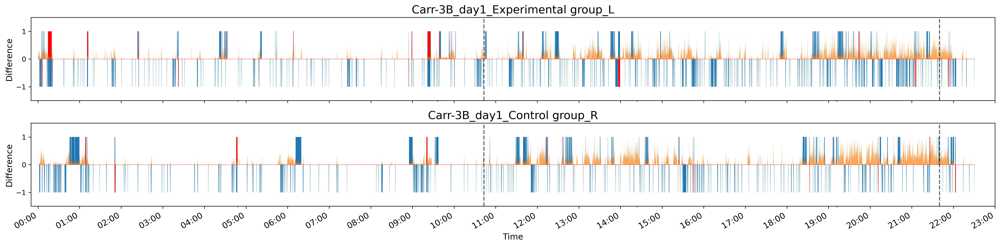

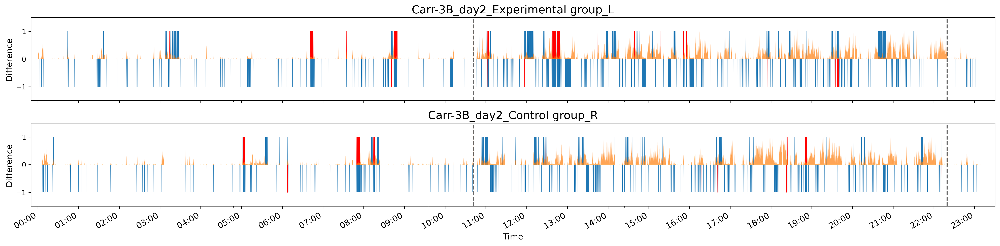

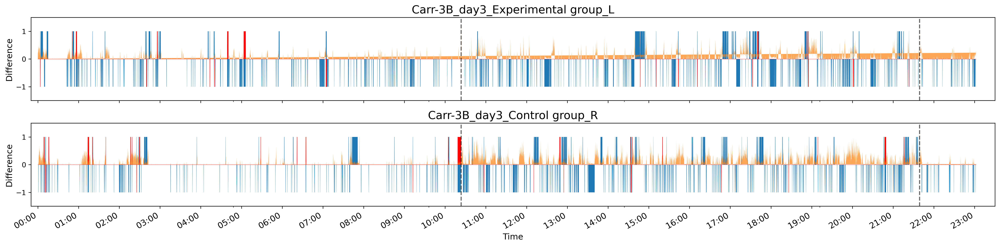

In [5]:
rat_lst = ['930217'] #['921111', '930217', '930302', '930316', '921216', '930203']    
swap_lst = ['921216', '930316', '930203'] # 左右顛倒, swap

code_dict = {'921111':'Carr-3A','930217':'Carr-3B', '930203':'Carr-1A','921216':'Carr-1B', '930302':'Frmln-A','930316':'Frmln-B'}

print('swap_lst ', swap_lst)
        
rat_lst_full = []
rat_dict = {}
for rat in rat_lst:
    r = int(rat)
    days = []
    for i in range(3):
        rr = r + i
        rat_lst_full.append(str(rr))
        days.append(str(rr))
    rat_dict[rat] = days
        
print(rat_lst_full)
print(rat_dict)



# 讀 tsn_my/comb_result_921111.csv , 裡面duration要有值
# comb_result_921111.csv 由 20201210_merge_rgb_flow_result.ipynb 產生, fix find_duration()計算duration

# label_lst = sorted(dpath.glob('_label*.csv'))
for rat, days in rat_dict.items():
    print('load comb_result_{}.csv'.format( rat))
    pred_fname = tsnpath.joinpath('comb_result_{}.csv'.format(rat))
    df_pred = pd.read_csv(pred_fname, index_col= 0)
    df_pred = df_pred.drop(['pred_x','pred_y'], axis=1)
    display(df_pred.head())
#                 print(df_pred.dtypes)
    print(df_pred.shape, 'target=1',len(df_pred[df_pred['target']==1]))
    code_name = code_dict[rat]  
    for di, rat_days in enumerate(days):
        print(rat_days)
        label_Lname = dpath.joinpath('_label_{}_L.csv'.format(rat_days))
        label_Rname = dpath.joinpath('_label_{}_R.csv'.format(rat_days))
        print(label_Lname)
        if not label_Lname.exists():
            print(label_Lname, ' does not exist')
            continue
        if not label_Rname.exists():
            print(label_Rname, ' does not exist')
            continue
            
        dfL = read_label(label_Lname, df_pred, rat_days, 'L')
        dfR = read_label(label_Rname, df_pred, rat_days, 'R')
        ss_day = dfL.sort_values('max_nonzero', ascending=False)[:3]
        
        display(dfL)
        dfL.to_csv('_xxx.csv')
#         print(dfL.dtypes)
        datemin = np.datetime64(dfL.iloc[0]['time'], 'h') - np.timedelta64(10, 'm')
        last_min = dfL.iloc[-1]['time'].minute
        if last_min < 30:
            datemax = np.datetime64(dfL.iloc[-1]['time'], 'h') + np.timedelta64(30, 'm')
        else:
            datemax = np.datetime64(dfL.iloc[-1]['time'], 'h') + np.timedelta64(1, 'h')
#         print('datemax ', datemax, dfL.iloc[-1]['time'], dfL.iloc[-1]['time'].minute)
            
        if rat not in swap_lst:        
            titleL = '{}_day{}_Experimental group_L'.format(code_name, di+1)
            titleR = '{}_day{}_Control group_R'.format(code_name, di+1)
        else:
            titleL = '{}_day{}_Control group_L'.format(code_name, di+1)
            titleR = '{}_day{}_Experimental group_R'.format(code_name, di+1)
            
        f, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 5), dpi=300, sharex=True)
        plt.subplots_adjust(hspace=0.30)
        dfL['nonzero_p5'] = dfL['nonzero_p5']*2
        dfR['nonzero_p5'] = dfR['nonzero_p5']*2
        
        plot_daily(dfL, ax1, datemin, datemax, titleL, ss_day)
        plot_daily(dfR, ax2, datemin, datemax, titleR, ss_day)

        fname = 'fig11_daily_{}_day{}.png'.format(code_name, di+1)
        plt.savefig(fname, dpi=300)
        print('output ', fname)
            
#     break

### Figure 2 showing for experimental and control animals, their population time profiles at 20 or 30 min bins (of either a count, or duration but only on data confirmed by human) over the 3 days. This is to show little signs of clear changes between experimental and control animals. Therefore, the analysis of histogram is needed.

swap_lst  ['921216', '930316', '930203']
['930217', '930218', '930219']
{'930217': ['930217', '930218', '930219']}
load comb_result_930217.csv
(3035, 8) target=1 579
930217
output  fig12_Carr-3B_day1_count_10min.png
output  fig12_Carr-3B_day1_duration_10min.png
930218
output  fig12_Carr-3B_day2_count_10min.png
output  fig12_Carr-3B_day2_duration_10min.png
930219
output  fig12_Carr-3B_day3_count_10min.png
output  fig12_Carr-3B_day3_duration_10min.png


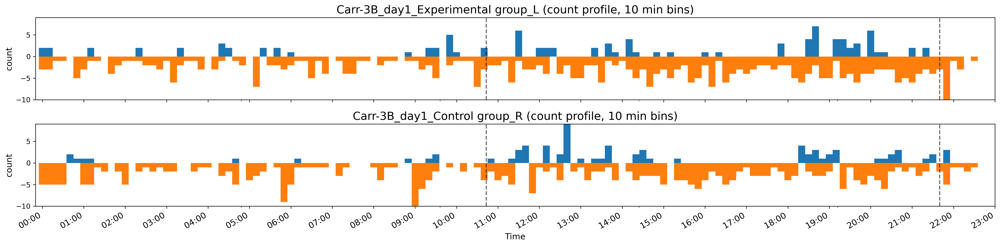

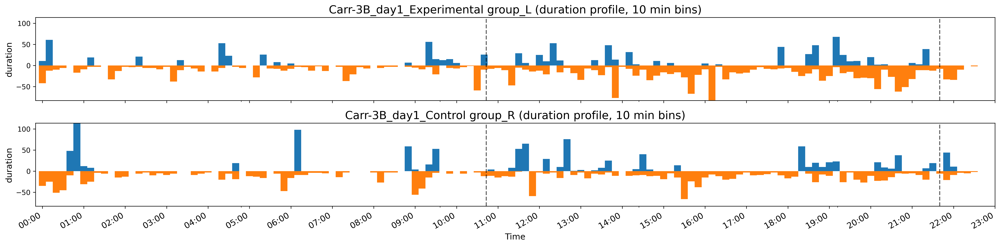

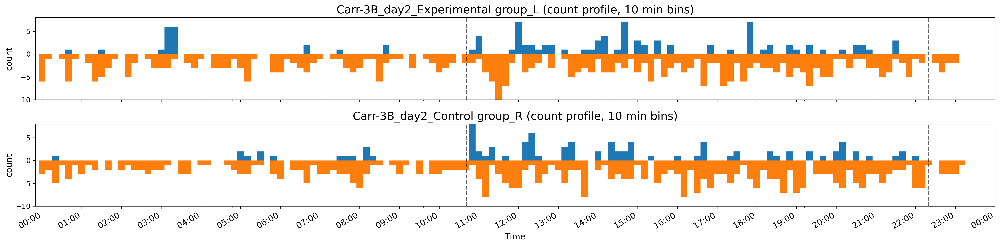

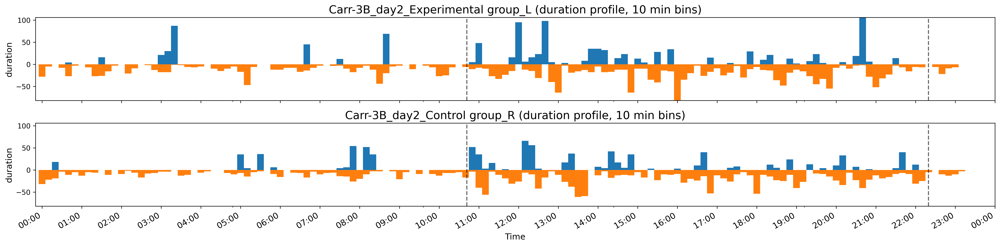

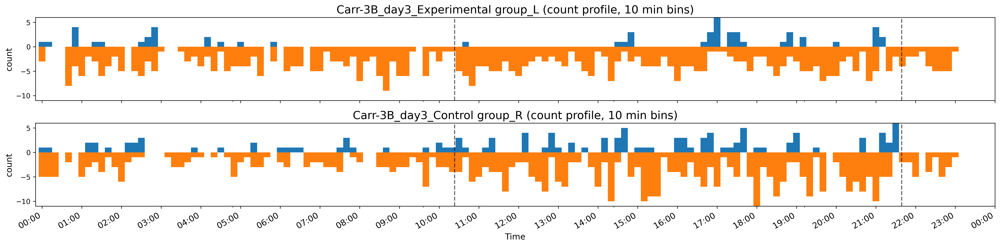

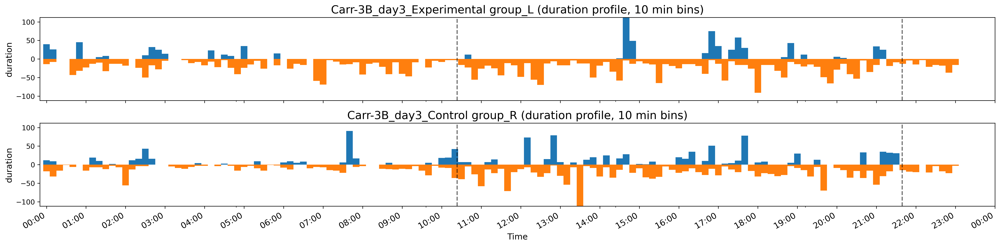

In [21]:
rat_lst = ['930217'] # ['921111', '930217', '930302', '930316', '921216', '930203']    
swap_lst = ['921216', '930316', '930203'] # 左右顛倒, swap
code_dict = {'921111':'Carr-3A','930217':'Carr-3B', '930203':'Carr-1A','921216':'Carr-1B', '930302':'Frmln-A','930316':'Frmln-B'}

print('swap_lst ', swap_lst)
        
rat_lst_full = []
rat_dict = {}
for rat in rat_lst:
    r = int(rat)
    days = []
    for i in range(3):
        rr = r + i
        rat_lst_full.append(str(rr))
        days.append(str(rr))
    rat_dict[rat] = days
        
print(rat_lst_full)
print(rat_dict)

hours = mdates.HourLocator() 
tm_fmt = mdates.DateFormatter('%H:%M')
freq_lst = ['10min'] #, '20min', '30min']
def target_diff(df):
    df = df.drop(['max_nonzero'], axis=1)
    ss = df['target'].diff()
    df.insert(len(df.columns), 'target_diff', ss)
    df = df.dropna()
    df = df.astype(dtype={'target_diff':np.int32}) 
    df['target_count_and'] = df['target_diff'] & df['target']   
    df['target_count_pos'] = df[df['target_count_and'] > 0 ]['target_count_and']
    df['target_count_neg'] = df[df['target_count_and'] < 0 ]['target_count_and']
    df['target_count_pos'].fillna(0,  inplace=True)
    df['target_count_neg'].fillna(0,  inplace=True)
    
    df['target_duration_pos'] = df[df['target'] > 0 ]['target']
    df['target_duration_neg'] = df[df['target'] < 0 ]['target']
    df['target_duration_pos'].fillna(0,  inplace=True)
    df['target_duration_neg'].fillna(0,  inplace=True)
    
    return df

def plot_profile(df, ax, datemin, datemax, title, ymin, ymax, ss_day, col):
    ax.set_ylim(ymin, ymax)

    # format the ticks
    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(tm_fmt)

    ax.format_xdata = tm_fmt
    ax.set_xlim(datemin, datemax)
    
    ax.set_ylabel(col, fontsize=12)
    ax.set_xlabel('Time', fontsize=12)
#     ax.fill_between('time', '{}_pos'.format(col), data=df,  lw=0.2)
#     ax.fill_between('time', '{}_neg'.format(col), data=df,  lw=0.2)
    ax.bar('time', '{}_pos'.format(col), data=df, width=0.007)
    ax.bar('time', '{}_neg'.format(col), data=df, width=0.007)

    for i in range(2):
        night_ss = pd.Series([ymin, ymax],  
                     index=[ss_day.iloc[i]['time'], ss_day.iloc[i]['time']] )
        night_ss.plot(ax=ax,alpha=0.6, color='k', linestyle='--')
        
    ax.set_title(title, fontsize=16)   
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12)     
    
def gen_time_profile(dfL, dfR, freq, col, titleL, titleR, code_name, day):
    col_target_pos = 'target_{}_pos'.format(col)
    col_target_neg = 'target_{}_neg'.format(col)
    
    pos_col = '{}_pos'.format(col)
    neg_col = '{}_neg'.format(col)
    
    ss_countLpos = dfL[col_target_pos].resample(freq).sum()
    ss_countLneg = dfL[col_target_neg].resample(freq).sum()
    df_Lcount = pd.DataFrame({pos_col:ss_countLpos, neg_col:ss_countLneg})        
    df_Lcount = df_Lcount.reset_index()
#             display(df_Lcount.head())
#             df_Lcount.to_csv('_df_Lcount_{}.csv'.format(rat_days))

    ss_countRpos = dfR[col_target_pos].resample(freq).sum()
    ss_countRneg = dfR[col_target_neg].resample(freq).sum()
    df_Rcount = pd.DataFrame({pos_col:ss_countRpos, neg_col:ss_countRneg})        
    df_Rcount = df_Rcount.reset_index()

    ymin = min(df_Lcount[neg_col].min(), df_Rcount[neg_col].min())
    ymax = max(df_Lcount[pos_col].max(), df_Rcount[pos_col].max())


    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 5), dpi=300, sharex=True)
    plt.subplots_adjust(hspace=0.30)
    plot_profile(df_Lcount, ax1, datemin, datemax, titleL, ymin, ymax, ss_day, col)
    plot_profile(df_Rcount, ax2, datemin, datemax, titleR, ymin, ymax, ss_day, col)
    
    fname = 'fig12_{}_day{}_{}_{}.png'.format(code_name, day, col, freq)
    plt.savefig(fname, dpi=300)     
    print('output ', fname)
            
for rat, days in rat_dict.items():
    print('load comb_result_{}.csv'.format( rat))
    pred_fname = tsnpath.joinpath('comb_result_{}.csv'.format(rat))
    df_pred = pd.read_csv(pred_fname, index_col= 0)
    df_pred = df_pred.drop(['pred_x','pred_y'], axis=1)
    print(df_pred.shape, 'target=1',len(df_pred[df_pred['target']==1]))
    code_name = code_dict[rat]  
    for d, rat_days in enumerate(days):
        print(rat_days)
        label_Lname = dpath.joinpath('_label_{}_L.csv'.format(rat_days))
        label_Rname = dpath.joinpath('_label_{}_R.csv'.format(rat_days))
#         print(label_Lname)
        if not label_Lname.exists():
            print(label_Lname, ' does not exist')
            continue
        if not label_Rname.exists():
            print(label_Rname, ' does not exist')
            continue

        dfL = read_label(label_Lname, df_pred, rat_days, 'L')
        dfR = read_label(label_Rname, df_pred, rat_days, 'R')
        ss_day = dfL.sort_values('max_nonzero', ascending=False)[:3]
        datemin = np.datetime64(dfL.iloc[0]['time'], 'h') - np.timedelta64(10, 'm')
        datemax = np.datetime64(dfL.iloc[-1]['time'], 'h') + np.timedelta64(1, 'h')

        dfL = target_diff(dfL)
        dfR = target_diff(dfR)

        dfL.to_csv('_dfL_{}.csv'.format(rat_days))
#         display(dfL.head())
#         print(dfL.dtypes)

        dfL = dfL.set_index('time')
        dfR = dfR.set_index('time')

        for freq in freq_lst:  
            if rat not in swap_lst:        
                titleL = '{}_day{}_Experimental group_L ({} profile, 10 min bins)'.format(code_name, d+1, 'count', freq)
                titleR = '{}_day{}_Control group_R ({} profile, 10 min bins)'.format(code_name, d+1, 'count',  freq)
            else:
                titleL = '{}_day{}_Control group_L ({} profile, 10 min bins)'.format(code_name, d+1, 'count', freq)
                titleR = '{}_day{}_Experimental group_R ({} profile, 10 min bins)'.format(code_name, d+1, 'count', freq)
        
            gen_time_profile(dfL, dfR, freq, 'count', titleL, titleR, code_name, d+1)

            if rat not in swap_lst:        
                titleL = '{}_day{}_Experimental group_L ({} profile, 10 min bins)'.format(code_name, d+1, 'duration', freq)
                titleR = '{}_day{}_Control group_R ({} profile, 10 min bins)'.format(code_name, d+1, 'duration',  freq)
            else:
                titleL = '{}_day{}_Control group_L ({} profile, 10 min bins)'.format(code_name, d+1, 'duration', freq)
                titleR = '{}_day{}_Experimental group_R ({} profile, 10 min bins)'.format(code_name, d+1, 'duration', freq)            
            gen_time_profile(dfL, dfR, freq, 'duration', titleL, titleR, code_name, d+1)
            

#         break

# 3. Supplementary Fig matching Fig 2, showing similar pictures of population (mean,SD of 6 datasets)

swap_lst  ['921216', '930316', '930203']
['921111', '921112', '921113', '930203', '930204', '930205', '921216', '921217', '921218', '930217', '930218', '930219', '930302', '930303', '930304', '930316', '930317', '930318']
{'921111': ['921111', '921112', '921113'], '930203': ['930203', '930204', '930205'], '921216': ['921216', '921217', '921218'], '930217': ['930217', '930218', '930219'], '930302': ['930302', '930303', '930304'], '930316': ['930316', '930317', '930318']}
load comb_result_921111.csv
(3207, 8) target=1 553
d, rat_days: 0 921111
d, rat_days: 1 921112
d, rat_days: 2 921113
load comb_result_930203.csv
(3026, 8) target=1 585
d, rat_days: 0 930203
d, rat_days: 1 930204
d, rat_days: 2 930205
load comb_result_921216.csv
(2986, 8) target=1 438
d, rat_days: 0 921216
d, rat_days: 1 921217
d, rat_days: 2 921218
load comb_result_930217.csv
(3035, 8) target=1 579
d, rat_days: 0 930217
d, rat_days: 1 930218
d, rat_days: 2 930219
load comb_result_930302.csv
(3093, 8) target=1 495
d, rat

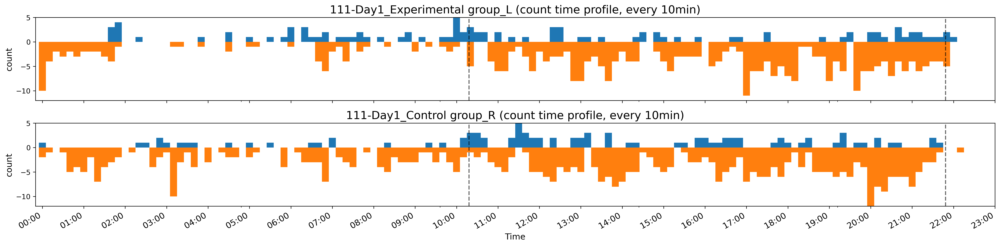

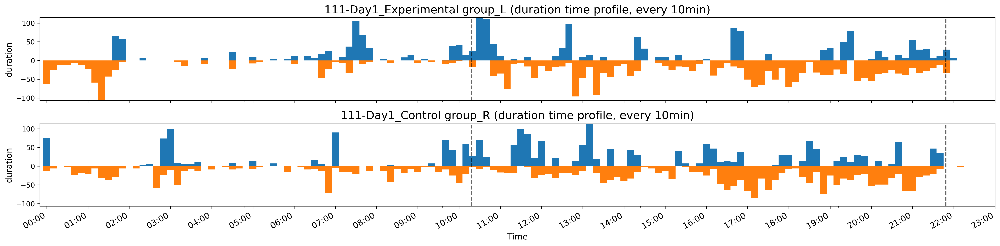

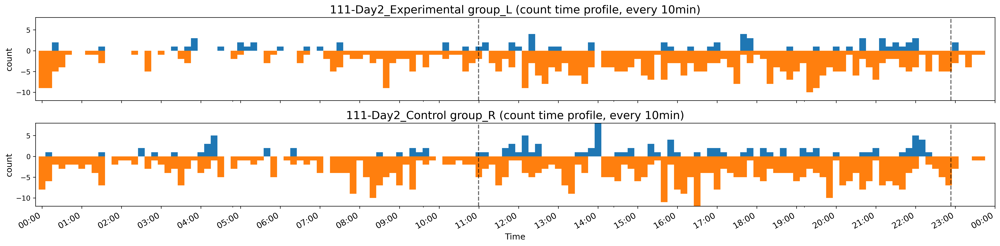

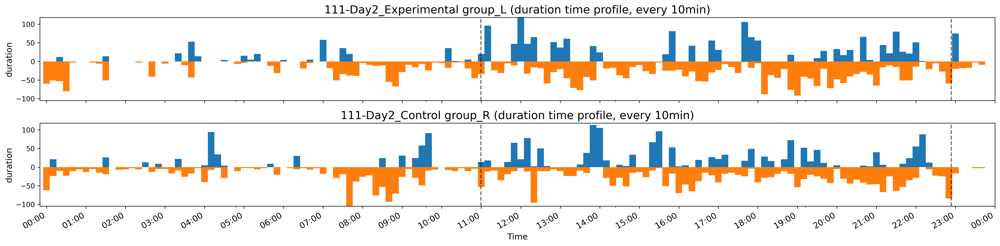

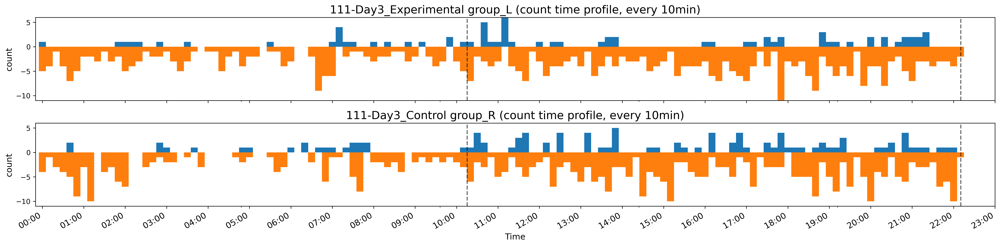

...

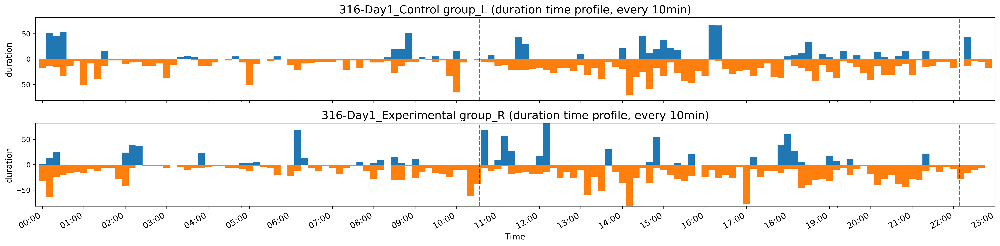

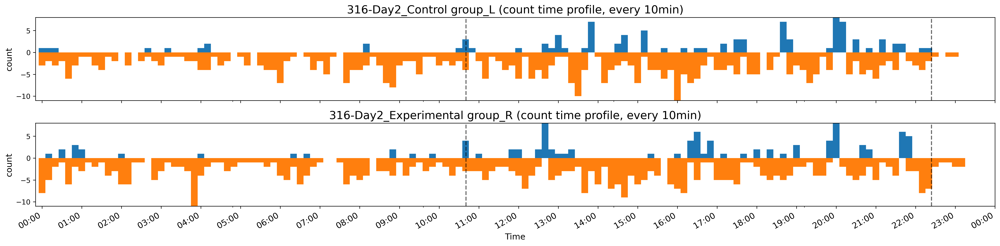

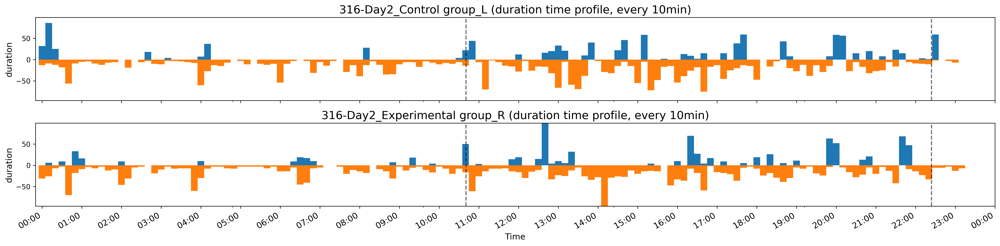

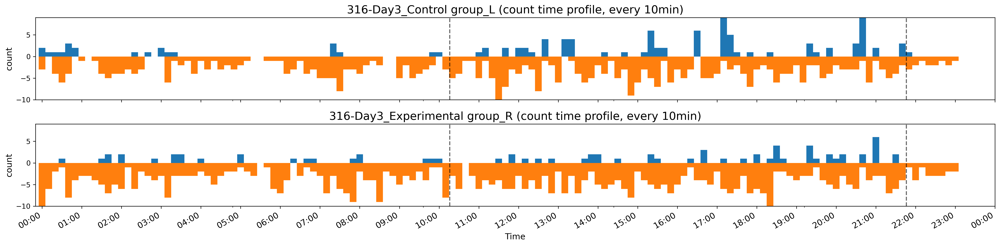

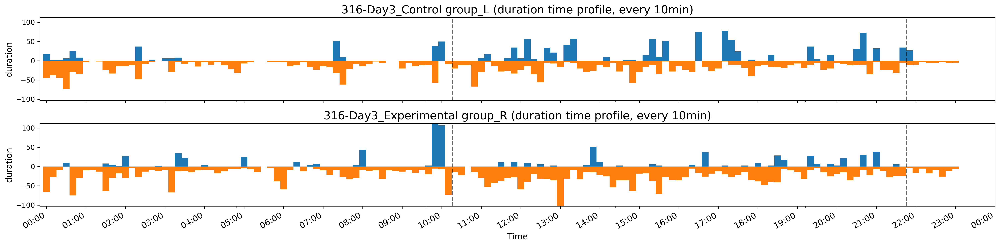

In [7]:
rat_lst = ['921111', '930203', '921216', '930217', '930302', '930316']     # 921111,930203,921216,930217, 930302, 930316
swap_lst = ['921216', '930316', '930203'] # 左右顛倒, swap
print('swap_lst ', swap_lst)
        
rat_lst_full = []
rat_dict = {}
for rat in rat_lst:
    r = int(rat)
    days = []
    for i in range(3):
        rr = r + i
        rat_lst_full.append(str(rr))
        days.append(str(rr))
    rat_dict[rat] = days
        
print(rat_lst_full)
print(rat_dict)

hours = mdates.HourLocator() 
tm_fmt = mdates.DateFormatter('%H:%M')
# freq_lst = ['10min'] #, '20min', '30min']
freq = '10min'
def target_diff(df):
    df = df.drop(['max_nonzero'], axis=1)
    ss = df['target'].diff()
    df.insert(len(df.columns), 'target_diff', ss)
    df = df.dropna()
    df = df.astype(dtype={'target_diff':np.int32}) 
    df['target_count_and'] = df['target_diff'] & df['target']   
    df['target_count_pos'] = df[df['target_count_and'] > 0 ]['target_count_and']
    df['target_count_neg'] = df[df['target_count_and'] < 0 ]['target_count_and']
    df['target_count_pos'].fillna(0,  inplace=True)
    df['target_count_neg'].fillna(0,  inplace=True)
    
    df['target_duration_pos'] = df[df['target'] > 0 ]['target']
    df['target_duration_neg'] = df[df['target'] < 0 ]['target']
    df['target_duration_pos'].fillna(0,  inplace=True)
    df['target_duration_neg'].fillna(0,  inplace=True)
    
    df = df.astype(dtype={'target_count_pos':np.int32, 'target_count_neg':np.int32, 
                          'target_duration_pos':np.int32, 'target_duration_neg':np.int32}) 
    
    return df

def plot_profile(df, ax, datemin, datemax, title, ymin, ymax, ss_day, col):
    ax.set_ylim(ymin, ymax)

    # format the ticks
    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(tm_fmt)

    ax.format_xdata = tm_fmt
    ax.set_xlim(datemin, datemax)
    
    ax.set_ylabel(col, fontsize=12)
    ax.set_xlabel('Time', fontsize=12)
    
#     ax.fill_between('time', '{}_pos'.format(col), data=df,  lw=0.2)
#     ax.fill_between('time', '{}_neg'.format(col), data=df,  lw=0.2)
    ax.bar('time', '{}_pos'.format(col), data=df, width=0.007)
    ax.bar('time', '{}_neg'.format(col), data=df, width=0.007)

    for i in range(2):
        night_ss = pd.Series([ymin, ymax],  
                     index=[ss_day.iloc[i]['time'], ss_day.iloc[i]['time']] )
        night_ss.plot(ax=ax,alpha=0.6, color='k', linestyle='--')
        
    ax.set_title(title, fontsize=16)    
    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12)     
    
def gen_time_profile(dfL, dfR, freq, col, titleL, titleR):
    col_target_pos = 'target_{}_pos'.format(col)
    col_target_neg = 'target_{}_neg'.format(col)
    
    pos_col = '{}_pos'.format(col)
    neg_col = '{}_neg'.format(col)
    
    ss_countLpos = dfL[col_target_pos].resample(freq).sum()
    ss_countLneg = dfL[col_target_neg].resample(freq).sum()
    df_Lcount = pd.DataFrame({pos_col:ss_countLpos, neg_col:ss_countLneg})        
    df_Lcount = df_Lcount.reset_index()

    ss_countRpos = dfR[col_target_pos].resample(freq).sum()
    ss_countRneg = dfR[col_target_neg].resample(freq).sum()
    df_Rcount = pd.DataFrame({pos_col:ss_countRpos, neg_col:ss_countRneg})        
    df_Rcount = df_Rcount.reset_index()

    ymin = min(df_Lcount[neg_col].min(), df_Rcount[neg_col].min())
    ymax = max(df_Lcount[pos_col].max(), df_Rcount[pos_col].max())


    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 5), dpi=300, sharex=True)
    plt.subplots_adjust(hspace=0.30)
    plot_profile(df_Lcount, ax1, datemin, datemax, titleL, ymin, ymax, ss_day, col)
    plot_profile(df_Rcount, ax2, datemin, datemax, titleR, ymin, ymax, ss_day, col)
            
    return df_Lcount, df_Rcount
    
count_lf_lst = []
count_rt_lst = []
dura_lf_lst = []
dura_rt_lst = []

for rat, days in rat_dict.items():
    print('load comb_result_{}.csv'.format( rat))
    pred_fname = tsnpath.joinpath('comb_result_{}.csv'.format(rat))
    df_pred = pd.read_csv(pred_fname, index_col= 0)
    df_pred = df_pred.drop(['pred_x','pred_y'], axis=1)
    print(df_pred.shape, 'target=1',len(df_pred[df_pred['target']==1]))

    for d, rat_days in enumerate(days):
        print('d, rat_days:', d, rat_days)
        label_Lname = dpath.joinpath('_label_{}_L.csv'.format(rat_days))
        label_Rname = dpath.joinpath('_label_{}_R.csv'.format(rat_days))
#         print(label_Lname)
        if not label_Lname.exists():
            print(label_Lname, ' does not exist')
            continue
        if not label_Rname.exists():
            print(label_Rname, ' does not exist')
            continue

        dfL = read_label(label_Lname, df_pred, rat_days, 'L')
        dfR = read_label(label_Rname, df_pred, rat_days, 'R')
        ss_day = dfL.sort_values('max_nonzero', ascending=False)[:3]
        datemin = np.datetime64(dfL.iloc[0]['time'], 'h') - np.timedelta64(10, 'm')
        datemax = np.datetime64(dfL.iloc[-1]['time'], 'h') + np.timedelta64(1, 'h')

        dfL = target_diff(dfL)
        dfR = target_diff(dfR)

#         dfL.to_csv('_dfL_{}.csv'.format(rat_days))
#         display(dfL.head())
#         print(dfL.dtypes)

        dfL = dfL.set_index('time')
        dfR = dfR.set_index('time')

        
        if rat not in swap_lst:        
            titleL = '{}-Day{}_Experimental group_L ({} time profile, every {})'.format(rat[3:], d+1, 'count', freq)
            titleR = '{}-Day{}_Control group_R ({} time profile, every {})'.format(rat[3:], d+1, 'count',  freq)
        else:
            titleL = '{}-Day{}_Control group_L ({} time profile, every {})'.format(rat[3:], d+1, 'count', freq)
            titleR = '{}-Day{}_Experimental group_R ({} time profile, every {})'.format(rat[3:], d+1, 'count', freq)

        dfl_count, dfr_count = gen_time_profile(dfL, dfR, freq, 'count', titleL, titleR)
        dfl_count['rat'] = rat_days
        dfr_count['rat'] = rat_days
        dfl_count['day'] = d
        dfr_count['day'] = d
        

        count_lf_lst.append(dfl_count)
        count_rt_lst.append(dfr_count)
        
        if rat not in swap_lst:        
            titleL = '{}-Day{}_Experimental group_L ({} time profile, every {})'.format(rat[3:], d+1, 'duration', freq)
            titleR = '{}-Day{}_Control group_R ({} time profile, every {})'.format(rat[3:], d+1, 'duration',  freq)
        else:
            titleL = '{}-Day{}_Control group_L ({} time profile, every {})'.format(rat[3:], d+1, 'duration', freq)
            titleR = '{}-Day{}_Experimental group_R ({} time profile, every {})'.format(rat[3:], d+1, 'duration', freq)   
            
        dfl_dura, dfr_dura = gen_time_profile(dfL, dfR, freq, 'duration', titleL, titleR)
        dfl_dura['rat'] = rat_days
        dfr_dura['rat'] = rat_days     
        dfl_dura['day'] = d
        dfr_dura['day'] = d           

        
        dura_lf_lst.append(dfl_dura)
        dura_rt_lst.append(dfr_dura)
        
#         display(dfl_dura)
        

df_count6_lf = pd.concat(count_lf_lst)
df_count6_rt = pd.concat(count_rt_lst)
df_dura6_lf = pd.concat(dura_lf_lst)
df_dura6_rt = pd.concat(dura_rt_lst)

In [8]:
display(df_count6_lf)

,time,count_pos,count_neg,rat,day
0,1970-01-01 00:00:00,0,-10,921111,0
1,1970-01-01 00:10:00,0,-4,921111,0
2,1970-01-01 00:20:00,0,-2,921111,0
3,1970-01-01 00:30:00,0,-3,921111,0
4,1970-01-01 00:40:00,0,-2,921111,0
...,...,...,...,...,...
134,1970-01-01 22:20:00,0,-2,930318,2
135,1970-01-01 22:30:00,0,-2,930318,2
136,1970-01-01 22:40:00,0,-1,930318,2
137,1970-01-01 22:50:00,0,-2,930318,2


# 20210910 comments
As discussed, please add the statistical comparison (in a Table form and/or bar chart) of grooming 
count/time, summed grooming duration (or %) based on 6 confirmed datasets at 10 samples/day. 
Since they represent the current manual method of detecting/analyzing grooming. If the results 
reveal no clear difference, it would be easier to argue why we need to analyze the duration distribution 
for pain-related changes.

In [9]:
rat_lst = ['921111', '930203', '921216', '930217', '930302', '930316']     # 921111,930203,921216,930217, 930302, 930316
swap_lst = ['921216', '930316', '930203'] # 左右顛倒, swap
print('swap_lst ', swap_lst)
        
rat_lst_full = []
rat_dict = {}
for rat in rat_lst:
    r = int(rat)
    days = []
    for i in range(3):
        rr = r + i
        rat_lst_full.append(str(rr))
        days.append(str(rr))
    rat_dict[rat] = days
        
print(rat_lst_full)
print(rat_dict)

hours = mdates.HourLocator() 
tm_fmt = mdates.DateFormatter('%H:%M')
# freq_lst = ['10min'] #, '20min', '30min']
freq = '2H'
    
def gen_time_statistics(dfL, dfR, freq, col, titleL, titleR):
    col_target_pos = 'target_{}_pos'.format(col)
    col_target_neg = 'target_{}_neg'.format(col)
    
    pos_col = '{}_pos'.format(col)
    neg_col = '{}_neg'.format(col)
    
    ss_countLpos = dfL[col_target_pos].resample(freq).sum()
    ss_countLneg = dfL[col_target_neg].resample(freq).sum()
    
#     ss_meanLpos = dfL[col_target_pos].resample(freq).mean()
#     ss_meanLneg = dfL[col_target_neg].resample(freq).mean()
    
#     ss_stdLpos = dfL[col_target_pos].resample(freq).std()
#     ss_stdLneg = dfL[col_target_neg].resample(freq).std()    
    
    df_Lcount = pd.DataFrame({pos_col:ss_countLpos, neg_col:ss_countLneg}) 
#                              pos_col+'_mean':ss_meanLpos, neg_col+'_mean':ss_meanLneg,
#                              pos_col+'_std':ss_stdLpos, neg_col+'_std':ss_stdLneg})        
    df_Lcount = df_Lcount.reset_index()

    ss_countRpos = dfR[col_target_pos].resample(freq).sum()
    ss_countRneg = dfR[col_target_neg].resample(freq).sum()
    
#     ss_meanRpos = dfR[col_target_pos].resample(freq).mean()
#     ss_meanRneg = dfR[col_target_neg].resample(freq).mean()
    
#     ss_stdRpos = dfR[col_target_pos].resample(freq).std()
#     ss_stdRneg = dfR[col_target_neg].resample(freq).std()    
    
    df_Rcount = pd.DataFrame({pos_col:ss_countRpos, neg_col:ss_countRneg})
#                               pos_col+'_mean':ss_meanRpos, neg_col+'_mean':ss_meanRneg,
#                               pos_col+'_std':ss_stdRpos, neg_col+'_std':ss_stdRneg})      
    
    df_Rcount = df_Rcount.reset_index()
            
    return df_Lcount, df_Rcount
    
count_lf_lst = []
count_rt_lst = []
dura_lf_lst = []
dura_rt_lst = []

for rat, days in rat_dict.items():
    print('load comb_result_{}.csv'.format( rat))
    pred_fname = tsnpath.joinpath('comb_result_{}.csv'.format(rat))
    df_pred = pd.read_csv(pred_fname, index_col= 0)
    df_pred = df_pred.drop(['pred_x','pred_y'], axis=1)
    print(df_pred.shape, 'target=1',len(df_pred[df_pred['target']==1]))

    for d, rat_days in enumerate(days):
        print('d, rat_days:', d, rat_days)
        label_Lname = dpath.joinpath('_label_{}_L.csv'.format(rat_days))
        label_Rname = dpath.joinpath('_label_{}_R.csv'.format(rat_days))
#         print(label_Lname)
        if not label_Lname.exists():
            print(label_Lname, ' does not exist')
            continue
        if not label_Rname.exists():
            print(label_Rname, ' does not exist')
            continue

        dfL = read_label(label_Lname, df_pred, rat_days, 'L')
        dfR = read_label(label_Rname, df_pred, rat_days, 'R')
        ss_day = dfL.sort_values('max_nonzero', ascending=False)[:3]
        datemin = np.datetime64(dfL.iloc[0]['time'], 'h') - np.timedelta64(10, 'm')
        datemax = np.datetime64(dfL.iloc[-1]['time'], 'h') + np.timedelta64(1, 'h')

        dfL = target_diff(dfL)
        dfR = target_diff(dfR)

#         dfL.to_csv('_dfL_{}.csv'.format(rat_days))
#         display(dfL.head())
#         print(dfL.dtypes)

        dfL = dfL.set_index('time')
        dfR = dfR.set_index('time')

        
        if rat not in swap_lst:        
            titleL = '{}-Day{}_Experimental group_L ({} time profile, every {})'.format(rat[3:], d+1, 'count', freq)
            titleR = '{}-Day{}_Control group_R ({} time profile, every {})'.format(rat[3:], d+1, 'count',  freq)
        else:
            titleL = '{}-Day{}_Control group_L ({} time profile, every {})'.format(rat[3:], d+1, 'count', freq)
            titleR = '{}-Day{}_Experimental group_R ({} time profile, every {})'.format(rat[3:], d+1, 'count', freq)

        dfl_count, dfr_count = gen_time_statistics(dfL, dfR, freq, 'count', titleL, titleR)
        dfl_count['rat'] = rat[-3:] #rat_days
        dfr_count['rat'] = rat[-3:] #rat_days
        dfl_count['day'] = d+1
        dfr_count['day'] = d+1
        
        dfl_count = dfl_count[:11]
        dfr_count = dfr_count[:11]
        count_lf_lst.append(dfl_count)
        count_rt_lst.append(dfr_count)
        
        if rat not in swap_lst:        
            titleL = '{}-Day{}_Experimental group_L ({} time profile, every {})'.format(rat[3:], d+1, 'duration', freq)
            titleR = '{}-Day{}_Control group_R ({} time profile, every {})'.format(rat[3:], d+1, 'duration',  freq)
        else:
            titleL = '{}-Day{}_Control group_L ({} time profile, every {})'.format(rat[3:], d+1, 'duration', freq)
            titleR = '{}-Day{}_Experimental group_R ({} time profile, every {})'.format(rat[3:], d+1, 'duration', freq)   
            
        dfl_dura, dfr_dura = gen_time_statistics(dfL, dfR, freq, 'duration', titleL, titleR)
        dfl_dura['rat'] = rat[-3:] #rat_days
        dfr_dura['rat'] = rat[-3:] #rat_days     
        dfl_dura['day'] = d+1
        dfr_dura['day'] = d+1

        dfl_dura = dfl_dura[:11]
        dfr_dura = dfr_dura[:11]
        
        dura_lf_lst.append(dfl_dura)
        dura_rt_lst.append(dfr_dura)
        
#         display(dfl_dura)
#         break
#     break
        

df_count6_lf = pd.concat(count_lf_lst).reset_index(drop=True)
df_count6_rt = pd.concat(count_rt_lst).reset_index(drop=True)
df_dura6_lf = pd.concat(dura_lf_lst).reset_index(drop=True)
df_dura6_rt = pd.concat(dura_rt_lst).reset_index(drop=True)

df_count6_lf['count_neg'] = df_count6_lf['count_neg']*-1
df_count6_rt['count_neg'] = df_count6_rt['count_neg']*-1
df_dura6_lf['duration_neg'] = df_dura6_lf['duration_neg']*-1
df_dura6_rt['duration_neg'] = df_dura6_rt['duration_neg']*-1

df_count6_lf = df_count6_lf.rename(columns={"count_pos": "count_groom", "count_neg": "count_nongroom"})
df_count6_rt = df_count6_rt.rename(columns={"count_pos": "count_groom", "count_neg": "count_nongroom"})

df_dura6_lf = df_dura6_lf.rename(columns={"duration_pos": "duration_groom", "duration_neg": "duration_nongroom"})
df_dura6_rt = df_dura6_rt.rename(columns={"duration_pos": "duration_groom", "duration_neg": "duration_nongroom"})

display(df_count6_lf)

swap_lst  ['921216', '930316', '930203']
['921111', '921112', '921113', '930203', '930204', '930205', '921216', '921217', '921218', '930217', '930218', '930219', '930302', '930303', '930304', '930316', '930317', '930318']
{'921111': ['921111', '921112', '921113'], '930203': ['930203', '930204', '930205'], '921216': ['921216', '921217', '921218'], '930217': ['930217', '930218', '930219'], '930302': ['930302', '930303', '930304'], '930316': ['930316', '930317', '930318']}
load comb_result_921111.csv
(3207, 8) target=1 553
d, rat_days: 0 921111
d, rat_days: 1 921112
d, rat_days: 2 921113
load comb_result_930203.csv
(3026, 8) target=1 585
d, rat_days: 0 930203
d, rat_days: 1 930204
d, rat_days: 2 930205
load comb_result_921216.csv
(2986, 8) target=1 438
d, rat_days: 0 921216
d, rat_days: 1 921217
d, rat_days: 2 921218
load comb_result_930217.csv
(3035, 8) target=1 579
d, rat_days: 0 930217
d, rat_days: 1 930218
d, rat_days: 2 930219
load comb_result_930302.csv
(3093, 8) target=1 495
d, rat

,time,count_groom,count_nongroom,rat,day
0,1970-01-01 00:00:00,7,38,111,1
1,1970-01-01 02:00:00,2,3,111,1
2,1970-01-01 04:00:00,5,4,111,1
3,1970-01-01 06:00:00,16,21,111,1
4,1970-01-01 08:00:00,7,7,111,1
...,...,...,...,...,...
193,1970-01-01 12:00:00,17,42,316,3
194,1970-01-01 14:00:00,13,52,316,3
195,1970-01-01 16:00:00,22,42,316,3
196,1970-01-01 18:00:00,7,43,316,3


In [10]:
# display(df_count6_rt)
df3 = pd.merge(df_count6_lf, df_count6_rt,  suffixes=["_L", "_R"], left_index=True, right_index=True).drop(['time_R','rat_R', 'day_R'], axis=1)
df4 = pd.merge(df_dura6_lf, df_dura6_rt,  suffixes=["_L", "_R"], left_index=True, right_index=True)
df4 = df4.drop(['time_L', 'time_R','rat_L', 'day_L','rat_R', 'day_R'], axis=1)
df5 = pd.merge(df3, df4,  left_index=True, right_index=True)
df5 = df5.rename(columns={"time_L": "time", "rat_L": "rat", "day_L": "day"})
df5 = df5.astype(dtype={'day':'str'}) 

df5['ratday'] = df5['rat']+'_'+df5['day']
# display(df3)
# display(df4)
display(df5)

,time,count_groom_L,count_nongroom_L,rat,day,count_groom_R,count_nongroom_R,duration_groom_L,duration_nongroom_L,duration_groom_R,duration_nongroom_R,ratday
0,1970-01-01 00:00:00,7,38,111,1,1,36,123,392,76,192,111_1
1,1970-01-01 02:00:00,2,3,111,1,8,26,14,30,212,183,111_1
2,1970-01-01 04:00:00,5,4,111,1,3,15,40,34,29,53,111_1
3,1970-01-01 06:00:00,16,21,111,1,4,27,328,134,112,170,111_1
4,1970-01-01 08:00:00,7,7,111,1,3,29,71,32,122,161,111_1
...,...,...,...,...,...,...,...,...,...,...,...,...
193,1970-01-01 12:00:00,17,42,316,3,6,54,218,241,73,421,316_3
194,1970-01-01 14:00:00,13,52,316,3,6,63,144,252,24,439,316_3
195,1970-01-01 16:00:00,22,42,316,3,6,53,233,208,48,258,316_3
196,1970-01-01 18:00:00,7,43,316,3,15,50,71,174,101,280,316_3


In [11]:
cols = ['count_groom_L','count_nongroom_L','count_groom_R','count_nongroom_R','duration_groom_L','duration_nongroom_L','duration_groom_R','duration_nongroom_R']
df_lst = []
for c in cols:
    df6 = df5.groupby('ratday')[c].agg(['mean', 'std'])
    df6 = df6.rename(columns={"mean": c+"_mean", "std": c+"_std"})
    df_lst.append(df6)
#     display(df6)
df7 = pd.concat(df_lst, axis = 1)
df7 = df7.reset_index()
df7['rat'] = df7['ratday'].apply(lambda x: x[:3])
df7['day'] = df7['ratday'].apply(lambda x: int(x[-1]))
display(df7)

,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
0,111_1,8.9091,5.7871,33.1818,21.7569,8.2727,6.1659,39.7273,16.5233,168.4545,112.0940,244.4545,166.8181,191.0000,121.1767,249.1818,140.3031,111,1
1,111_2,6.0000,4.1713,36.3636,18.9804,8.6364,5.3155,45.0909,14.8422,162.4545,138.0778,291.6364,163.8092,165.8182,117.1391,277.0909,130.9347,111,2
2,111_3,6.7273,5.0018,39.9091,11.8191,9.2727,6.6497,38.0909,16.1954,144.0909,97.8483,264.1818,135.2907,186.9091,138.6827,220.0000,102.5037,111,3
3,203_1,8.0909,6.8768,32.3636,14.7802,7.2727,9.2097,36.1818,13.3703,86.0909,77.4951,162.0000,106.0726,66.3636,72.6075,169.5455,71.5854,203,1
4,203_2,9.8182,6.7944,29.6364,8.1027,7.5455,4.5025,41.6364,16.8776,109.9091,61.2919,135.7273,48.6952,80.5455,39.7149,223.9091,108.3425,203,2
5,203_3,8.1818,8.3044,33.8182,9.3789,7.2727,5.8325,37.4545,10.7179,73.8182,67.3748,161.9091,67.9742,72.5455,55.5020,207.4545,91.9471,203,3
6,216_1,7.6364,4.5667,33.0000,12.4499,5.3636,4.3880,39.2727,9.5508,116.1818,65.6259,161.0000,95.1998,89.2727,87.0909,221.4545,86.9268,216,1
7,216_2,7.8182,5.0560,34.4545,13.2391,5.0000,5.0794,36.3636,11.2274,108.7273,70.8323,185.5455,93.3096,90.9091,98.4504,219.9091,95.6770,216,2
8,216_3,5.4545,4.7825,35.7273,8.8780,6.7273,5.4054,38.8182,12.5922,68.0909,65.4056,231.8182,59.6470,116.1818,71.8259,224.0000,86.7502,216,3
9,217_1,9.0000,6.0166,33.3636,12.3715,7.0000,7.1554,28.6364,7.3793,86.7273,56.2425,180.8182,87.1697,96.8182,65.7051,139.7273,57.4040,217,1


# count mean and sd

,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
0,111_1,8.9091,5.7871,33.1818,21.7569,8.2727,6.1659,39.7273,16.5233,168.4545,112.0940,244.4545,166.8181,191.0000,121.1767,249.1818,140.3031,111,1
3,203_1,8.0909,6.8768,32.3636,14.7802,7.2727,9.2097,36.1818,13.3703,86.0909,77.4951,162.0000,106.0726,66.3636,72.6075,169.5455,71.5854,203,1
6,216_1,7.6364,4.5667,33.0000,12.4499,5.3636,4.3880,39.2727,9.5508,116.1818,65.6259,161.0000,95.1998,89.2727,87.0909,221.4545,86.9268,216,1
9,217_1,9.0000,6.0166,33.3636,12.3715,7.0000,7.1554,28.6364,7.3793,86.7273,56.2425,180.8182,87.1697,96.8182,65.7051,139.7273,57.4040,217,1
12,302_1,6.2727,4.4066,39.6364,15.6989,6.9091,4.0609,41.0909,12.4294,97.0000,67.7008,203.7273,98.8090,60.7273,35.1257,226.4545,77.7964,302,1
15,316_1,6.4545,4.5467,36.1818,11.2855,5.5455,2.8413,38.9091,12.5575,77.8182,64.7098,204.0000,90.8471,80.8182,49.9196,211.3636,81.6557,316,1


,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
1,111_2,6.0000,4.1713,36.3636,18.9804,8.6364,5.3155,45.0909,14.8422,162.4545,138.0778,291.6364,163.8092,165.8182,117.1391,277.0909,130.9347,111,2
4,203_2,9.8182,6.7944,29.6364,8.1027,7.5455,4.5025,41.6364,16.8776,109.9091,61.2919,135.7273,48.6952,80.5455,39.7149,223.9091,108.3425,203,2
7,216_2,7.8182,5.0560,34.4545,13.2391,5.0000,5.0794,36.3636,11.2274,108.7273,70.8323,185.5455,93.3096,90.9091,98.4504,219.9091,95.6770,216,2
10,217_2,8.9091,7.7260,32.3636,8.9473,8.2727,6.1007,33.0909,11.1306,100.0909,83.6510,187.7273,76.7425,79.0909,48.1154,166.0909,78.3843,217,2
13,302_2,7.4545,7.4211,37.8182,11.7968,6.9091,6.5948,38.1818,5.9467,129.2727,90.0068,179.1818,77.1969,59.0909,54.0027,222.4545,65.9566,302,2
16,316_2,8.3636,7.9533,36.9091,10.3581,8.7273,8.1620,38.0000,9.7570,90.1818,65.4887,211.9091,92.1677,80.7273,71.0466,196.6364,63.6275,316,2


,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
2,111_3,6.7273,5.0018,39.9091,11.8191,9.2727,6.6497,38.0909,16.1954,144.0909,97.8483,264.1818,135.2907,186.9091,138.6827,220.0000,102.5037,111,3
5,203_3,8.1818,8.3044,33.8182,9.3789,7.2727,5.8325,37.4545,10.7179,73.8182,67.3748,161.9091,67.9742,72.5455,55.5020,207.4545,91.9471,203,3
8,216_3,5.4545,4.7825,35.7273,8.8780,6.7273,5.4054,38.8182,12.5922,68.0909,65.4056,231.8182,59.6470,116.1818,71.8259,224.0000,86.7502,216,3
11,217_3,5.0909,5.0290,41.5455,6.2668,10.4545,5.9053,40.4545,16.4156,76.3636,76.4843,252.0909,62.5259,103.2727,72.1042,193.4545,93.3792,217,3
14,302_3,7.0000,6.0498,33.9091,10.7838,6.5455,4.4803,37.1818,10.7872,114.9091,81.1979,181.0000,98.0581,89.2727,86.9150,215.9091,77.0318,302,3
17,316_3,9.4545,7.2161,37.5455,9.7608,6.5455,3.9080,49.9091,8.6076,108.8182,78.5708,206.1818,66.4030,72.9091,46.7257,275.7273,103.1204,316,3


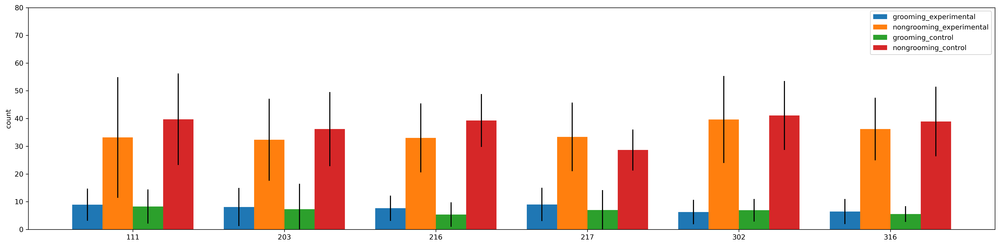

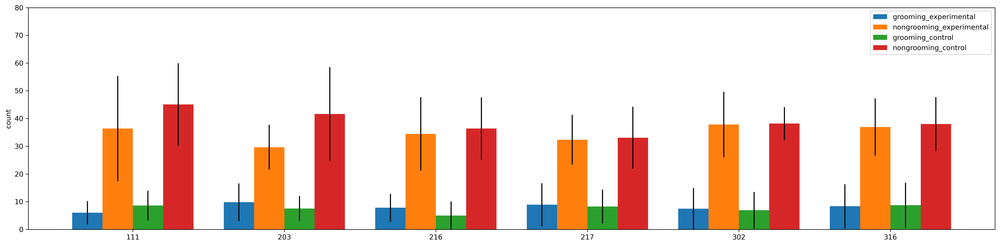

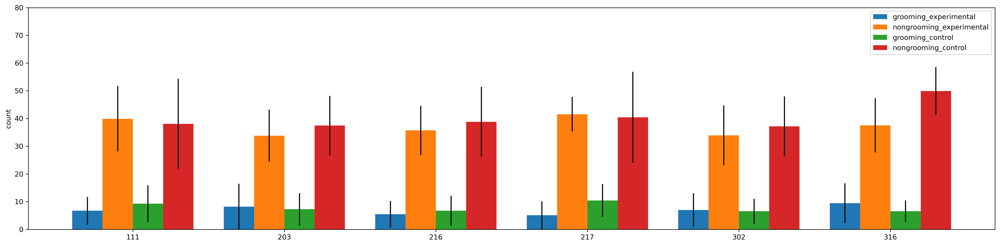

In [12]:
x = np.arange(6) 
for d in range(1,4):
    df_day1 = df7[df7['day']==d]
    display(df_day1)
    xlabels = df_day1['rat']
    fig, ax = plt.subplots(1, 1, figsize=(20, 5), dpi=300, sharex=True)
    ax.bar(x=x, height=df_day1['count_groom_L_mean'],  yerr=df_day1['count_groom_L_std'], label='grooming_experimental' , width = 0.2)
    ax.bar(x=x+0.2, height=df_day1['count_nongroom_L_mean'],  yerr=df_day1['count_nongroom_L_std'],  label='nongrooming_experimental' , width = 0.2)
    ax.bar(x=x+0.4, height=df_day1['count_groom_R_mean'],  yerr=df_day1['count_groom_R_std'], label='grooming_control' , width = 0.2)
    ax.bar(x=x+0.6, height=df_day1['count_nongroom_R_mean'],  yerr=df_day1['count_nongroom_R_std'],  label='nongrooming_control' , width = 0.2)

    ax.legend()
    ax.set_xticks(x+0.3)
    ax.set_xticklabels(xlabels)
    ax.set_ylim(0, 80)
    ax.set_ylabel('count')

# fig.tight_layout()


# duration mean and sd

,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
0,111_1,8.9091,5.7871,33.1818,21.7569,8.2727,6.1659,39.7273,16.5233,168.4545,112.0940,244.4545,166.8181,191.0000,121.1767,249.1818,140.3031,111,1
3,203_1,8.0909,6.8768,32.3636,14.7802,7.2727,9.2097,36.1818,13.3703,86.0909,77.4951,162.0000,106.0726,66.3636,72.6075,169.5455,71.5854,203,1
6,216_1,7.6364,4.5667,33.0000,12.4499,5.3636,4.3880,39.2727,9.5508,116.1818,65.6259,161.0000,95.1998,89.2727,87.0909,221.4545,86.9268,216,1
9,217_1,9.0000,6.0166,33.3636,12.3715,7.0000,7.1554,28.6364,7.3793,86.7273,56.2425,180.8182,87.1697,96.8182,65.7051,139.7273,57.4040,217,1
12,302_1,6.2727,4.4066,39.6364,15.6989,6.9091,4.0609,41.0909,12.4294,97.0000,67.7008,203.7273,98.8090,60.7273,35.1257,226.4545,77.7964,302,1
15,316_1,6.4545,4.5467,36.1818,11.2855,5.5455,2.8413,38.9091,12.5575,77.8182,64.7098,204.0000,90.8471,80.8182,49.9196,211.3636,81.6557,316,1


,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
1,111_2,6.0000,4.1713,36.3636,18.9804,8.6364,5.3155,45.0909,14.8422,162.4545,138.0778,291.6364,163.8092,165.8182,117.1391,277.0909,130.9347,111,2
4,203_2,9.8182,6.7944,29.6364,8.1027,7.5455,4.5025,41.6364,16.8776,109.9091,61.2919,135.7273,48.6952,80.5455,39.7149,223.9091,108.3425,203,2
7,216_2,7.8182,5.0560,34.4545,13.2391,5.0000,5.0794,36.3636,11.2274,108.7273,70.8323,185.5455,93.3096,90.9091,98.4504,219.9091,95.6770,216,2
10,217_2,8.9091,7.7260,32.3636,8.9473,8.2727,6.1007,33.0909,11.1306,100.0909,83.6510,187.7273,76.7425,79.0909,48.1154,166.0909,78.3843,217,2
13,302_2,7.4545,7.4211,37.8182,11.7968,6.9091,6.5948,38.1818,5.9467,129.2727,90.0068,179.1818,77.1969,59.0909,54.0027,222.4545,65.9566,302,2
16,316_2,8.3636,7.9533,36.9091,10.3581,8.7273,8.1620,38.0000,9.7570,90.1818,65.4887,211.9091,92.1677,80.7273,71.0466,196.6364,63.6275,316,2


,ratday,count_groom_L_mean,count_groom_L_std,count_nongroom_L_mean,count_nongroom_L_std,count_groom_R_mean,count_groom_R_std,count_nongroom_R_mean,count_nongroom_R_std,duration_groom_L_mean,duration_groom_L_std,duration_nongroom_L_mean,duration_nongroom_L_std,duration_groom_R_mean,duration_groom_R_std,duration_nongroom_R_mean,duration_nongroom_R_std,rat,day
2,111_3,6.7273,5.0018,39.9091,11.8191,9.2727,6.6497,38.0909,16.1954,144.0909,97.8483,264.1818,135.2907,186.9091,138.6827,220.0000,102.5037,111,3
5,203_3,8.1818,8.3044,33.8182,9.3789,7.2727,5.8325,37.4545,10.7179,73.8182,67.3748,161.9091,67.9742,72.5455,55.5020,207.4545,91.9471,203,3
8,216_3,5.4545,4.7825,35.7273,8.8780,6.7273,5.4054,38.8182,12.5922,68.0909,65.4056,231.8182,59.6470,116.1818,71.8259,224.0000,86.7502,216,3
11,217_3,5.0909,5.0290,41.5455,6.2668,10.4545,5.9053,40.4545,16.4156,76.3636,76.4843,252.0909,62.5259,103.2727,72.1042,193.4545,93.3792,217,3
14,302_3,7.0000,6.0498,33.9091,10.7838,6.5455,4.4803,37.1818,10.7872,114.9091,81.1979,181.0000,98.0581,89.2727,86.9150,215.9091,77.0318,302,3
17,316_3,9.4545,7.2161,37.5455,9.7608,6.5455,3.9080,49.9091,8.6076,108.8182,78.5708,206.1818,66.4030,72.9091,46.7257,275.7273,103.1204,316,3


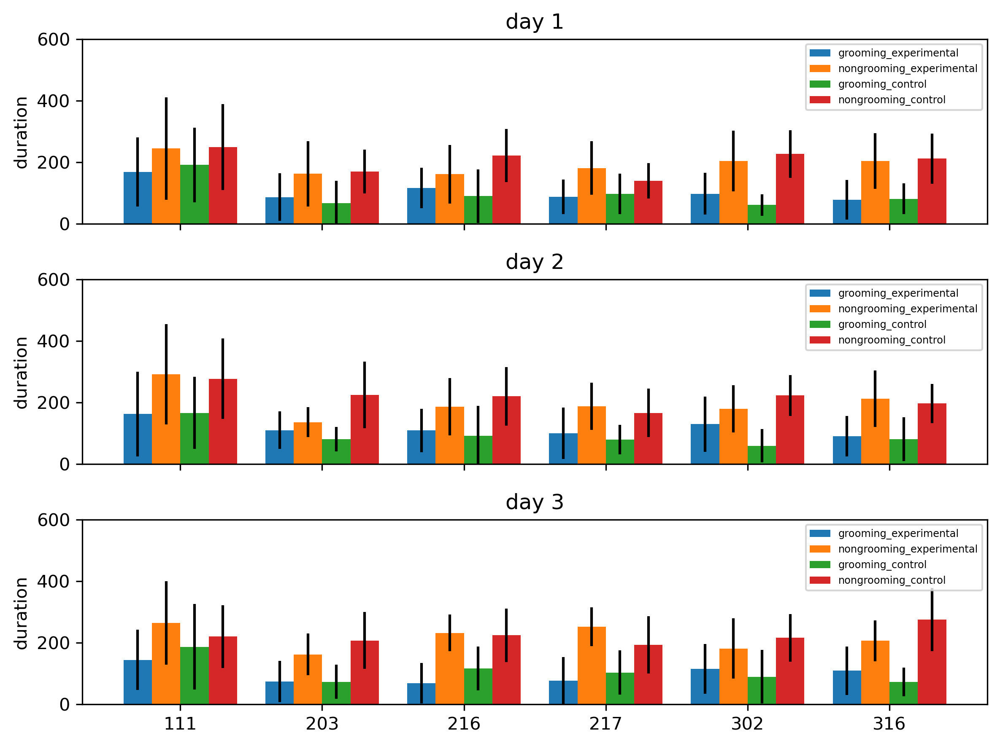

In [13]:
x = np.arange(6) 
fig, ax = plt.subplots(3, 1, figsize=(8, 6), dpi=300, sharex=True)
for d in range(1,4):
    df_day1 = df7[df7['day']==d]
    display(df_day1)
    xlabels = df_day1['rat']
    
    ax[d-1].bar(x=x, height=df_day1['duration_groom_L_mean'],  yerr=df_day1['duration_groom_L_std'], label='grooming_experimental' , width = 0.2)
    ax[d-1].bar(x=x+0.2, height=df_day1['duration_nongroom_L_mean'],  yerr=df_day1['duration_nongroom_L_std'],  label='nongrooming_experimental' , width = 0.2)
    ax[d-1].bar(x=x+0.4, height=df_day1['duration_groom_R_mean'],  yerr=df_day1['duration_groom_R_std'], label='grooming_control' , width = 0.2)
    ax[d-1].bar(x=x+0.6, height=df_day1['duration_nongroom_R_mean'],  yerr=df_day1['duration_nongroom_R_std'],  label='nongrooming_control' , width = 0.2)

    
    ax[d-1].set_xticks(x+0.3)
    ax[d-1].set_xticklabels(xlabels)
    ax[d-1].set_ylim(0, 600)
    ax[d-1].set_ylabel('duration')
    ax[d-1].set_title('day {}'.format(d)) 
    ax[d-1].legend(fontsize='xx-small')    
fname = 'duration_day{}.png'.format(0)
plt.savefig(fname, dpi=300)

In [14]:
count_lf_lst1 = [[],[],[]]
count_rt_lst1 = [[],[],[]]
dura_lf_lst1 = [[],[],[]]
dura_rt_lst1 = [[],[],[]]

i = 0
for rat, days in rat_dict.items():
    for d, rat_days in enumerate(days):
        count_lf_lst1[d].append(count_lf_lst[i])
        count_rt_lst1[d].append(count_rt_lst[i])
        dura_lf_lst1[d].append(dura_lf_lst[i])
        dura_rt_lst1[d].append(dura_rt_lst[i])        
        i+=1

In [15]:
df_count6_lf_day = []
df_count6_rt_day = []
df_dura6_lf_day = []
df_dura6_rt_day = []
for d in range(3):
    df_count6_lf_day.append(count_lf_lst1[d][0])
    df_count6_rt_day.append(count_rt_lst1[d][0])
    df_dura6_lf_day.append(dura_lf_lst1[d][0])
    df_dura6_rt_day.append(dura_rt_lst1[d][0])
 
    for i in range(1, len(rat_lst)):
        df_count6_lf_day[d] = pd.merge(df_count6_lf_day[d], count_lf_lst1[d][i], on='time')
        df_count6_rt_day[d] = pd.merge(df_count6_rt_day[d], count_rt_lst1[d][i], on='time')

        df_dura6_lf_day[d] = pd.merge(df_dura6_lf_day[d], dura_lf_lst1[d][i], on='time')
        df_dura6_rt_day[d] = pd.merge(df_dura6_rt_day[d], dura_rt_lst1[d][i], on='time')
     
display(df_count6_lf_day[2])

,time,count_pos_x,count_neg_x,rat_x,day_x,count_pos_y,count_neg_y,rat_y,day_y,count_pos_x,...,rat_y,day_y,count_pos_x,count_neg_x,rat_x,day_x,count_pos_y,count_neg_y,rat_y,day_y
0,1970-01-01 00:00:00,2,-39,111,3,7,-44,203,3,7,...,217,3,20,-58,302,3,10,-32,316,3
1,1970-01-01 02:00:00,5,-30,111,3,6,-28,203,3,11,...,217,3,8,-31,302,3,6,-28,316,3
2,1970-01-01 04:00:00,1,-24,111,3,2,-14,203,3,6,...,217,3,4,-31,302,3,0,-18,316,3
3,1970-01-01 06:00:00,7,-32,111,3,3,-24,203,3,1,...,217,3,4,-27,302,3,4,-45,316,3
4,1970-01-01 08:00:00,6,-23,111,3,4,-33,203,3,0,...,217,3,0,-23,302,3,1,-30,316,3
5,1970-01-01 10:00:00,16,-44,111,3,5,-31,203,3,2,...,217,3,4,-26,302,3,6,-45,316,3
6,1970-01-01 12:00:00,8,-43,111,3,17,-38,203,3,0,...,217,3,16,-33,302,3,17,-42,316,3
7,1970-01-01 14:00:00,0,-41,111,3,3,-33,203,3,1,...,217,3,9,-46,302,3,13,-52,316,3
8,1970-01-01 16:00:00,9,-58,111,3,5,-44,203,3,10,...,217,3,4,-24,302,3,22,-42,316,3
9,1970-01-01 18:00:00,6,-56,111,3,30,-43,203,3,10,...,217,3,2,-31,302,3,7,-43,316,3


In [16]:
def calc_3days_stat(df_day_lst, col):
    df_lst = []
    for d in range(3):
        pos_lst = ['time']
        neg_lst = ['time']
        for c in df_day_lst[d].columns:
            if 'pos' in c:
                pos_lst.append(c)
            if 'neg' in c:
                neg_lst.append(c)

    #     print(pos_lst)    
    #     print(neg_lst)  
        df_count_pos = df_day_lst[d].loc[:,pos_lst]
        df_count_neg = df_day_lst[d].loc[:,neg_lst]
        df_count_pos = df_count_pos.set_index('time')
        df_count_neg = df_count_neg.set_index('time')

        count_pos_mean = df_count_pos.mean(axis='columns')
        count_neg_mean = df_count_neg.mean(axis='columns')
        count_pos_std = df_count_pos.std(axis='columns')
        count_neg_std = df_count_neg.std(axis='columns')

    #     display(df_count_pos.head())
    #     print(count_pos_mean)

        dfs1 = pd.DataFrame({'{}_pos_mean_{}'.format(col, d):count_pos_mean, 
                            '{}_neg_mean_{}'.format(col, d):count_neg_mean,
                            '{}_pos_std_{}'.format(col, d):count_pos_std, 
                            '{}_neg_std_{}'.format(col, d):count_neg_std})
        df_lst.append(dfs1)
    #     display(dfs1)  

    df_state = pd.concat(df_lst, axis=1) 
    df_state = df_state.reset_index()
    return df_state 

In [17]:
col = 'count'
df_state_count_lf = calc_3days_stat(df_count6_lf_day, col)
df_state_count_rt = calc_3days_stat(df_count6_rt_day, col)
col = 'duration'
df_state_dura_lf = calc_3days_stat(df_dura6_lf_day, col)
df_state_dura_rt = calc_3days_stat(df_dura6_rt_day, col)

display(df_state_count_lf.head())
display(df_state_dura_rt.head())

,time,count_pos_mean_0,count_neg_mean_0,count_pos_std_0,count_neg_std_0,count_pos_mean_1,count_neg_mean_1,count_pos_std_1,count_neg_std_1,count_pos_mean_2,count_neg_mean_2,count_pos_std_2,count_neg_std_2
0,1970-01-01 00:00:00,6.8333,-35.0000,3.3299,10.0294,1.8333,-31.1667,0.9235,10.6840,9.0000,-39.5000,5.6360,10.3199
1,1970-01-01 02:00:00,2.0000,-19.3333,1.5718,8.6636,5.5000,-23.3333,3.8844,7.6003,7.1667,-30.5000,2.0073,2.4314
2,1970-01-01 04:00:00,4.6667,-18.6667,2.7008,9.7014,4.5000,-25.6667,2.8336,9.5732,3.0000,-27.0000,2.2229,9.4682
3,1970-01-01 06:00:00,6.0000,-25.3333,5.3797,7.4597,4.8333,-23.5000,2.9356,8.2907,3.1667,-31.0000,2.3326,8.0586
4,1970-01-01 08:00:00,5.5000,-20.5000,3.7924,8.3331,1.6667,-31.3333,0.9701,6.1357,1.8333,-32.3333,2.4071,9.3871


,time,duration_pos_mean_0,duration_neg_mean_0,duration_pos_std_0,duration_neg_std_0,duration_pos_mean_1,duration_neg_mean_1,duration_pos_std_1,duration_neg_std_1,duration_pos_mean_2,duration_neg_mean_2,duration_pos_std_2,duration_neg_std_2
0,1970-01-01 00:00:00,81.3333,-250.0000,59.6628,81.0185,33.0000,-179.5000,24.4949,50.6502,25.0000,-276.0000,18.9737,77.1195
1,1970-01-01 02:00:00,60.0000,-137.3333,83.0641,44.3170,9.6667,-158.1667,16.1682,79.8633,75.8333,-163.8333,35.3541,51.4716
2,1970-01-01 04:00:00,20.6667,-120.8333,9.5548,63.0278,80.1667,-127.3333,59.6916,45.0790,28.0000,-108.3333,40.6983,42.9993
3,1970-01-01 06:00:00,83.3333,-140.6667,42.6532,48.0245,38.0000,-153.0000,21.0126,73.7125,106.1667,-160.6667,117.4154,51.7528
4,1970-01-01 08:00:00,58.3333,-140.6667,51.3179,46.4137,81.0000,-210.1667,78.4264,130.7486,92.3333,-135.1667,80.1968,44.4830


In [18]:
def plot_profile1(df, ax, datemin, datemax, title, ymin, ymax, ss_day, col, d):
    ax.set_ylim(ymin, ymax)

    # format the ticks
    ax.xaxis.set_major_locator(hours)
    ax.xaxis.set_major_formatter(tm_fmt)

    ax.format_xdata = tm_fmt
    ax.set_xlim(datemin, datemax)
    
    ax.set_ylabel(col)
    
#     ax.fill_between('time', '{}_pos'.format(col), data=df,  lw=0.2)
#     ax.fill_between('time', '{}_neg'.format(col), data=df,  lw=0.2)
    ax.bar('time', '{}_pos_mean_{}'.format(col, d), data=df, width=0.007, yerr='{}_pos_std_{}'.format(col, d), ecolor='grey')
    ax.bar('time', '{}_neg_mean_{}'.format(col, d), data=df, width=0.007, yerr='{}_neg_std_{}'.format(col, d), ecolor='grey')

    for i in range(2):
        night_ss = pd.Series([ymin, ymax],  
                     index=[ss_day.iloc[i]['time'], ss_day.iloc[i]['time']] )
        night_ss.plot(ax=ax,alpha=0.6, color='r', linestyle='--')
        
    ax.set_title(title)    

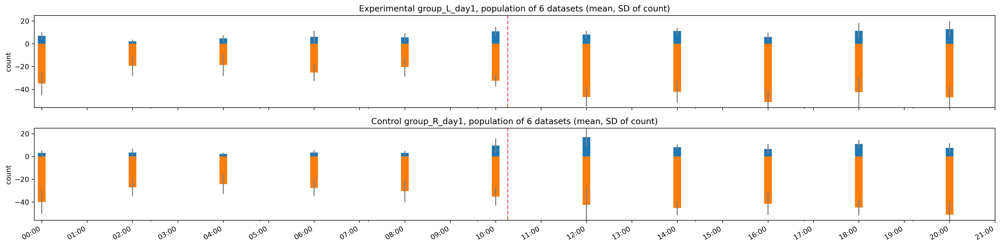

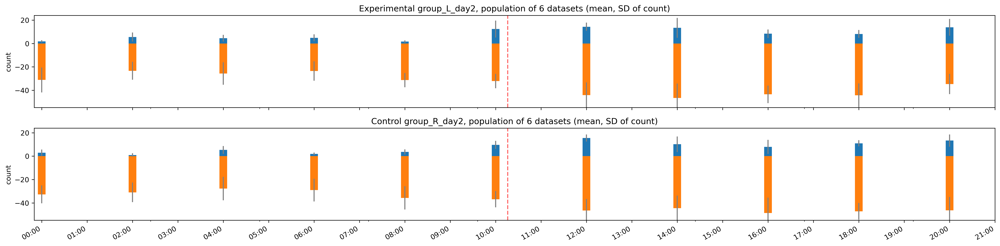

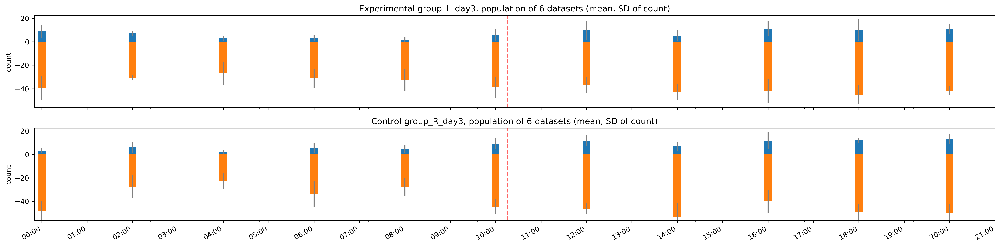

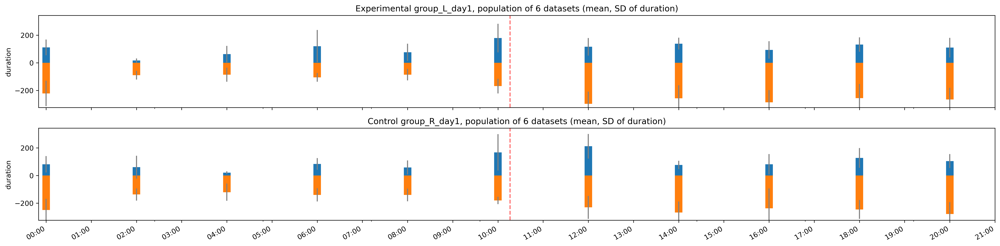

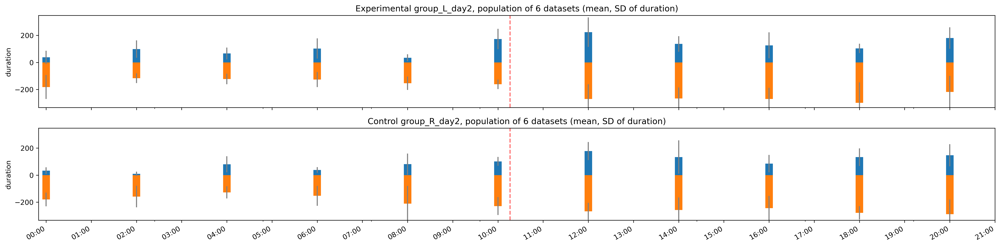

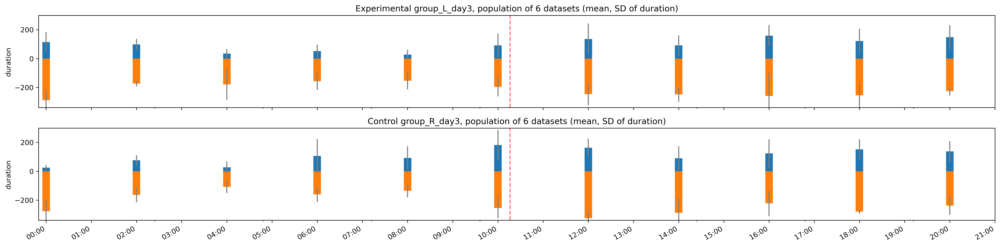

In [19]:
def show_3day(df_stat_lf, df_stat_rt, col):
    for d in range(3):
        neg_col = '{}_neg_mean_{}'.format(col, d)
        pos_col = '{}_pos_mean_{}'.format(col, d)
        ymin = min(df_stat_lf[neg_col].min(), df_stat_rt[neg_col].min())
        ymax = max(df_stat_lf[pos_col].max(), df_stat_rt[pos_col].max())
        
        neg_colstd = '{}_neg_std_{}'.format(col, d)
        pos_colstd = '{}_pos_std_{}'.format(col, d)
        yminstd = min(df_stat_lf[neg_colstd].min(), df_stat_rt[neg_colstd].min())
        ymaxstd = max(df_stat_lf[pos_colstd].max(), df_stat_rt[pos_colstd].max())
        
        ymin -= yminstd
        ymax += ymaxstd
        datemin = np.datetime64(df_stat_lf.iloc[0]['time'], 'h') - np.timedelta64(10, 'm')
        datemax = np.datetime64(df_stat_lf.iloc[-1]['time'], 'h') + np.timedelta64(1, 'h')

        titleL = 'Experimental group_L_day{}, population of 6 datasets (mean, SD of {})'.format(d+1, col)
        titleR = 'Control group_R_day{}, population of 6 datasets (mean, SD of {})'.format(d+1, col)
        
        f, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 5), dpi=300, sharex=True)
        plt.subplots_adjust(hspace=0.30)
        plot_profile1(df_stat_lf, ax1, datemin, datemax, titleL, ymin, ymax, ss_day, col, d)
        plot_profile1(df_stat_rt, ax2, datemin, datemax, titleR, ymin, ymax, ss_day, col, d)

col = 'count'
show_3day(df_state_count_lf, df_state_count_rt, col)
col = 'duration'
show_3day(df_state_dura_lf, df_state_dura_rt, col)

In [20]:
display(df_state_count_lf)
df_state_count_lf.to_csv('state_count_lf.csv')
df_state_dura_lf.to_csv('state_dura_lf.csv')
df_state_count_rt.to_csv('state_count_rt.csv')
df_state_dura_rt.to_csv('state_dura_rt.csv')

,time,count_pos_mean_0,count_neg_mean_0,count_pos_std_0,count_neg_std_0,count_pos_mean_1,count_neg_mean_1,count_pos_std_1,count_neg_std_1,count_pos_mean_2,count_neg_mean_2,count_pos_std_2,count_neg_std_2
0,1970-01-01 00:00:00,6.8333,-35.0000,3.3299,10.0294,1.8333,-31.1667,0.9235,10.6840,9.0000,-39.5000,5.6360,10.3199
1,1970-01-01 02:00:00,2.0000,-19.3333,1.5718,8.6636,5.5000,-23.3333,3.8844,7.6003,7.1667,-30.5000,2.0073,2.4314
2,1970-01-01 04:00:00,4.6667,-18.6667,2.7008,9.7014,4.5000,-25.6667,2.8336,9.5732,3.0000,-27.0000,2.2229,9.4682
3,1970-01-01 06:00:00,6.0000,-25.3333,5.3797,7.4597,4.8333,-23.5000,2.9356,8.2907,3.1667,-31.0000,2.3326,8.0586
4,1970-01-01 08:00:00,5.5000,-20.5000,3.7924,8.3331,1.6667,-31.3333,0.9701,6.1357,1.8333,-32.3333,2.4071,9.3871
5,1970-01-01 10:00:00,10.8333,-32.5000,3.9594,4.8537,12.3333,-32.1667,7.1948,6.1573,5.6667,-39.0000,5.0643,8.5681
6,1970-01-01 12:00:00,8.0000,-46.6667,3.3077,8.5818,14.3333,-44.1667,3.5480,10.9450,9.6667,-37.0000,7.7155,6.9282
7,1970-01-01 14:00:00,11.1667,-42.1667,2.7493,9.6421,13.3333,-46.6667,8.4991,12.4286,5.1667,-43.0000,4.6936,6.8514
8,1970-01-01 16:00:00,5.8333,-51.1667,3.5355,9.9661,8.3333,-43.5000,3.6461,7.5088,11.1667,-41.8333,6.5999,10.1590
9,1970-01-01 18:00:00,11.3333,-42.5000,6.9197,12.9989,8.1667,-44.3333,3.3299,10.1286,10.1667,-45.0000,9.4387,7.9038
